<a href="https://colab.research.google.com/github/mimingfikriac/FungsiChaos_ImageProcessing/blob/main/Fungsi_Chaos_Logistic_Map_%26_Tent_Map_(Image_Processing).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pengembangan Fungsi *Chaos* Baru berdasarkan Fungsi *Logistic Map* dan *Tent Map*

Kelompok 2:
1. Ivana Joice Chandra (2306174955)
2. Miming Fikria Camilla (2306288912)

# Import Libraries

In [ ]:
import cv2
import requests

from PIL import Image

import numpy as np
import matplotlib.pyplot as plt

from numba import jit

import time

# Hide all warnings
import warnings
warnings.filterwarnings('ignore')

# find_variable_name

In [ ]:
def find_variable_name(variable):
    for name, value in globals().items():
        if value is variable:
            return name
    return None

# import_image

In [ ]:
def import_image(file_name,url):
    # Fetch the image data
    response = requests.get(url)

    # Check if the request was successful
    if response.status_code == 200:
        # Save the image data to a file
        with open(f'{file_name}.png', 'wb') as f:
            f.write(response.content)
        # Load the image
        img = Image.open(f'{file_name}.png')  # Replace with the correct path to your image

        # Display the image
        print(f'{file_name}.png')
        plt.imshow(img)
        plt.axis('off')  # Hide the axis
        plt.show()

        print("")

    else:
        print(f"{file_name} : failed to download the image.\n")

# show_original_matrix

In [ ]:
def show_original_matrix(matrix):
    file_name = find_variable_name(matrix)
    matrix_shape = matrix.shape
    print(f'\033[1m{file_name}\033[0m\n')
    print(f"Shape of the {file_name} matrix: {matrix_shape}\n")
    print("Original Matrix - R:")
    print(matrix[:,:,0])
    print("")
    print("Original Matrix - G:")
    print(matrix[:,:,1])
    print("")
    print("Original Matrix - B:")
    print(matrix[:,:,2])

# matrix

lena.png


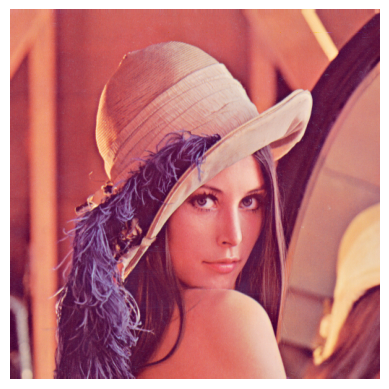


baboon.png


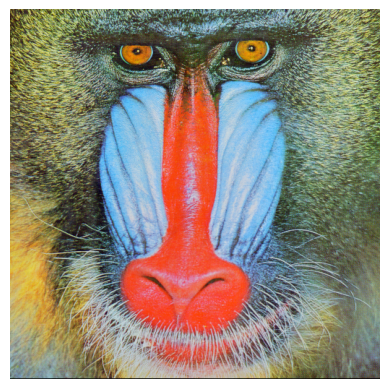


girl.png


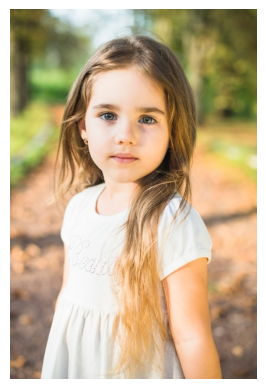


camera.png


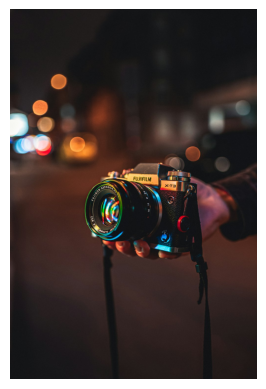


bird.png


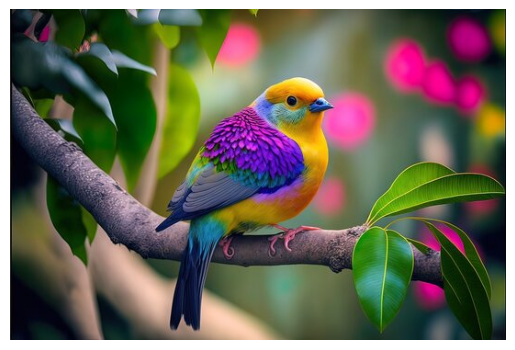


peppers.png


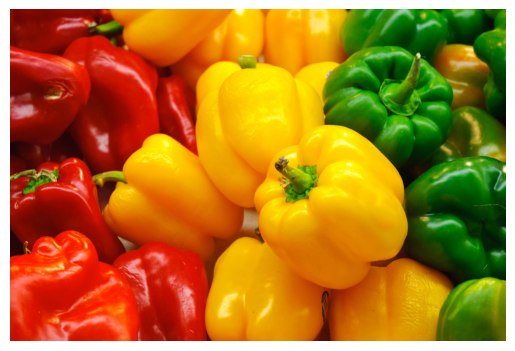

In [ ]:
# Define the file name for the image
file_name = ['lena','baboon','girl','camera','bird','peppers']

# URL of the image you want to download
lena_url   = "https://camo.githubusercontent.com/0126636c94b7b4016f05c40c25e7710b218ba33ddc35836f4d0c5d62ad5a24a2/68747470733a2f2f7261772e6769746875622e636f6d2f6d696b6f6c616c7973656e6b6f2f6c656e612f6d61737465722f6c656e612e706e67"
baboon_url = "https://raw.githubusercontent.com/mikolalysenko/baboon-image/master/baboon.png"
girl_url   = "https://img.freepik.com/free-photo/portrait-cute-little-girl-with-long-hair-standing-park_23-2147893135.jpg?size=626&ext=jpg&ga=GA1.1.553209589.1714953600&semt=ais"
camera_url = "https://images.unsplash.com/photo-1607462109225-6b64ae2dd3cb?q=80&w=1000&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxzZWFyY2h8MTF8fGNhbWVyYXxlbnwwfHwwfHx8MA%3D%3D"
bird_url = "https://t4.ftcdn.net/jpg/05/65/36/03/360_F_565360370_LrWWCTxczrmwqpsPYPljiFyE4gFqpecr.jpg"
peppers_url = "https://hips.hearstapps.com/hmg-prod/images/red-yellow-and-green-bell-peppers-royalty-free-image-1659638115.jpg"

url = [lena_url, baboon_url, girl_url, camera_url, bird_url, peppers_url]

# Import the image
for k in range(len(file_name)):
  import_image(file_name[k],url[k])

In [ ]:
# Open the downloaded image
lena = Image.open('lena.png')

# Convert the image to RGB mode if it's not already in RGB
lena = lena.convert('RGB')

# Convert the image to a NumPy array
lena = np.array(lena)

show_original_matrix(lena)

lena

Shape of the lena matrix: (512, 512, 3)

Original Matrix - R:
[[226 226 223 ... 230 221 200]
 [226 226 223 ... 230 221 200]
 [226 226 223 ... 230 221 200]
 ...
 [ 84  84  92 ... 173 172 177]
 [ 82  82  96 ... 179 181 185]
 [ 82  82  96 ... 179 181 185]]

Original Matrix - G:
[[137 137 137 ... 148 130  99]
 [137 137 137 ... 148 130  99]
 [137 137 137 ... 148 130  99]
 ...
 [ 18  18  27 ...  73  68  62]
 [ 22  22  32 ...  70  71  74]
 [ 22  22  32 ...  70  71  74]]

Original Matrix - B:
[[125 125 133 ... 122 110  90]
 [125 125 133 ... 122 110  90]
 [125 125 133 ... 122 110  90]
 ...
 [ 60  60  58 ...  84  76  79]
 [ 57  57  62 ...  79  81  81]
 [ 57  57  62 ...  79  81  81]]


In [ ]:
baboon = Image.open('baboon.png')
baboon = baboon.convert('RGB')
baboon = np.array(baboon)

girl = Image.open('girl.png')
girl = girl.convert('RGB')
girl = np.array(girl)

camera = Image.open('camera.png')
camera = camera.convert('RGB')
camera = np.array(camera)

bird = Image.open('bird.png')
bird = bird.convert('RGB')
bird = np.array(bird)

peppers = Image.open('peppers.png')
peppers = peppers.convert('RGB')
peppers = np.array(peppers)

# Define Generally Used Functions for Encrypting

In [ ]:
def generate_key(x0, r, rgb_matrix, function):
    """
    Generate a key matrix using any chaos function.
    """
    rows = rgb_matrix.shape[0]
    cols = rgb_matrix.shape[1]
    X = np.zeros((rows,cols))
    x = x0

    for i in range(rows):
      for j in range(cols):
        x = function(x,r)
        X[i,j] = x

    X = (np.floor(X*1000)) % 256
    X = X.astype(np.uint8)

    return X

def encrypt_matrix(matrix, key):
    """
    Encrypt a matrix using XOR operation with a key.
    """
    encrypted_matrix = np.zeros((matrix.shape[0],matrix.shape[1]))

    for i in range(matrix.shape[0]):
      for j in range(matrix.shape[1]):
        encrypted_matrix[i,j] = matrix[i,j] ^ key[i,j]
    return encrypted_matrix

def encrypt_image(x0_values, r_values, rgb_matrix, function, code_name):
    if len(x0_values) != 3 or len(r_values) != 3:
      print("Error: Input list must contain exactly three elements")
      return
    else:
      # Start timing
      start_time = time.time()

      file_name = find_variable_name(rgb_matrix)
      parameter = {'x0' : x0_values, 'r' : r_values}
      key = []

      encrypted_matrix = np.zeros_like(rgb_matrix)

      for i, x0 in enumerate(parameter['x0']):
        # Generate key
        encryption_key = generate_key(x0,parameter['r'][i],rgb_matrix,function)
        key.append(encryption_key)

        encrypted_matrix[:, :, i] = encrypt_matrix(rgb_matrix[:, :, i], encryption_key)

      # Ensure values are within valid range (0-255) and convert to uint8
      encrypted_matrix = np.uint8(encrypted_matrix)

      # Save the encrypted image
      encrypted_image_file_name = f'{file_name}_encrypted_{code_name}'
      cv2.imwrite(f'{encrypted_image_file_name}.png', encrypted_matrix)

      # End timing
      end_time = time.time()

      # Print the execution time
      execution_time = end_time - start_time
      print(f"\033[1m{function.__name__} - {file_name}\033[0m\n")
      print(f"Execution time: {execution_time} seconds")

      print(f"Encrypted image saved as {encrypted_image_file_name}.png")

      return file_name, function, rgb_matrix, parameter, key, encrypted_matrix

def show_encryption_result(encryption_data):
    encrypted_matrix = encryption_data[5]

    plt.imshow(encrypted_matrix)
    plt.axis('off')
    plt.show()

def show_result_comparison(encryption_data):
    file_name, function, rgb_matrix, parameter, key, encrypted_matrix = encryption_data

    # Prepare to display the results
    fig, axes = plt.subplots(1, 2) #figsize=(20, 15)

    # Display the original image in the first subplot
    axes[0].imshow(rgb_matrix)
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(encrypted_matrix)
    axes[1].set_title('Encrypted Image')
    axes[1].axis('off')

    plt.suptitle(f'Comparison of Original and Encrypted Images Using {function.__name__} - {file_name}\nx0 = {parameter["x0"]}, r = {parameter["r"]}')
    plt.subplots_adjust(wspace=0.1)

    plt.tight_layout()
    plt.show()

def show_key(encryption_data):
    file_name, function, rgb_matrix, parameter, key, encrypted_matrix = encryption_data

    variable_name = find_variable_name(encryption_data)

    print(f'Total key matrices found: {len(key)}\n')

    try:
      index = int(input('Select the key matrix you want to display (1-3): ')) - 1
      key_matrix = key[index]
      x0 = parameter['x0'][index]
      r = parameter['r'][index]

      if index == 0:
        color = 'red'
      elif index == 1:
        color = 'green'
      elif index == 2:
        color = 'blue'

      print("")
      print(f"Shape of the key matrix: {key_matrix.shape}\n")
      print(f"\033[1mThe key generated in {variable_name}")
      print(f"for encrypting the {color} channel")
      print(f"using x0 = {x0} and r = {r} is:\033[0m\n{key_matrix}")

    except IndexError:
      print("Index out of range. Input exceeds the number of key matrices found.")

def show_encrypted_matrix(encryption_data):
    file_name, function, rgb_matrix, parameter, key, encrypted_matrices = encryption_data

    variable_name = find_variable_name(encryption_data)

    print(f'Total encrypted matrices : {len(encrypted_matrices)}\n')
    if len(encrypted_matrices) == 1:
       x0 = parameter["x0"][0]
       r = parameter["r"][0]

       print(f"Shape of the encrypted matrix: {encrypted_matrices[0].shape}\n")
       print(f"\033[1mThe encrypted matrix generated in {variable_name}\nusing x0 = {x0} and r = {r} is:\033[0m\n")

       for k in range(3):
          if k == 0:
            print('Encrypted matrix - R')
          elif k == 1:
            print('Encrypted matrix - G')
          else:
            print('Encrypted_matrix - B')

          print(encrypted_matrices[0][:,:,k])
          print('')
    else:
      print("Enter the parameters used for the encrypted matrix you want to display")
      x0 = float(input("x0 = "))
      x0_index = parameter['x0'].index(x0)
      r = float(input("r = "))
      r_index = parameter['r'].index(r)
      print("")

      # Find the index of the encrypted_matrices generated using x0_index and r_index
      try:
          # Calculate the encrypted_matrices index using x0_index and r_index
          encrypted_matrices_index = x0_index * len(parameter["r"]) + r_index

          # Get the encrypted_matrices using the calculated encrypted_matrices index
          encrypted_matrix = encrypted_matrices[encrypted_matrices_index]

          print(f"Shape of the encrypted matrix: {encrypted_matrix.shape}\n")
          print(f"\033[1mThe encrypted matrix generated in {variable_name}\nusing x0 = {x0} and r = {r} is:\033[0m\n")

          for k in range(3):
            if k == 0:
              print('Encrypted matrix - R')
            elif k == 1:
              print('Encrypted matrix - G')
            else:
              print('Encrypted_matrix - B')

            print(encrypted_matrix[:,:,k])
            print('')

      except ValueError:
          print("Invalid input for x0 or r.")
      except IndexError:
          print("Index out of range. Make sure x0 and r values are within the specified ranges.")

# Define Function to Show The Bifurcation Diagram

In [ ]:
def show_bifurcation_diagram(function,x0,r_min,r_max,num_r,iterations,last=100):
    """
    Show the bifurcation diagram for any chaos function
    """
    r_values = np.linspace(r_min, r_max, num_r)

    # Storage for bifurcation data
    bifurcation_data = np.zeros((num_r, last))

    for i, r in enumerate(r_values):
      r_list = []
      x_list = []
      for j in range(iterations):
        if j == 0:
          x = function(x0, r)
        else:
          x = function(x_list[j-1], r)
        r_list.append(r)
        x_list.append(x)
      bifurcation_data[i] = x_list[-last:]

    # Plotting bifurcation diagram
    plt.figure(figsize=(8, 5))
    for i in range(last):
        plt.plot(r_values, bifurcation_data[:, i], ',k', alpha=0.15)
    plt.title(f'Bifurcation Diagram - {function.__name__}\nx0 = {x0}, iterations = {iterations}')
    plt.xlabel('r')
    plt.ylabel('x')
    plt.show()

# Define Function to Show the Lyapunov Exponent Diagram

In [ ]:
@jit
def lyapunov_exponent(map_func, derivative_func, x0, r_values, iterations):
    """
    Calculate the Lyapunov exponent values for any map function.

    Parameters:
    map_func (function): The map function.
    derivative_func (function): The derivative of the map function.
    x0 (float): The initial value.
    r_values (np.ndarray): Array of parameter values.
    iterations (int): Number of iterations.

    Returns:
    np.ndarray: Array of Lyapunov exponent values.
    """
    # Storage for Lyapunov exponents
    lyapunov = np.zeros(r_values.shape)

    # Calculate Lyapunov exponent for each r
    for i, r in enumerate(r_values):
        x = x0
        sum_log_deriv = 0.0
        for _ in range(iterations):
            x = map_func(x, r)
            sum_log_deriv += np.log(abs(derivative_func(x, r)))
        lyapunov[i] = sum_log_deriv / iterations

    return lyapunov

def show_lyapunov_diagram(map_func, derivative_func, x0, r_min, r_max, num_r, iterations):
    """
    Plot the lyapunov exponent values for any chaos function
    """
    r_values = np.linspace(r_min, r_max, num_r)

    # Lyapunov exponent calculation
    lyapunov_exponents = lyapunov_exponent(map_func, derivative_func, x0, r_values, iterations)

    # Plotting Lyapunov exponent
    plt.figure(figsize=(8, 5))
    plt.plot(r_values, lyapunov_exponents, ',r')
    plt.title(f'Lyapunov Exponent - {map_func.__name__}\nx0 = {x0}, iterations = {iterations}')
    plt.xlabel('r')
    plt.ylabel('Lyapunov Exponent')
    plt.axhline(0, color='k', lw=0.5, linestyle='dashed')

    plt.tight_layout()
    plt.show()

# Scenario 1 - Logistic Map

## Define Functions

In [ ]:
def LogisticMap(x, r):
    return r * x * (1 - x)

def LogisticMap_derivative(x, r):
    return abs(r - 2 * r * x)

def encrypt_logistic(x0_log, r_log, rgb_matrix):
    """
    Encrypt an image using logistic map and single value for each parameters
    """
    file_name, function, rgb_matrix, parameter, key, encrypted_matrix = encrypt_image(x0_log, r_log, rgb_matrix, LogisticMap, 'log')
    return file_name, function, rgb_matrix, parameter, key, encrypted_matrix

## Encryption Results

### Lena

LogisticMap - lena

Execution time: 1.325913667678833 seconds
Encrypted image saved as lena_encrypted_log.png



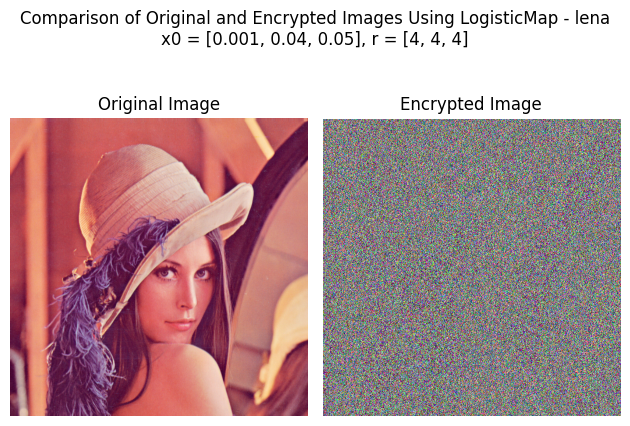

In [ ]:
# Set parameters
x0_log = [0.001,0.04,0.05]  # Initial condition, range : 0-1
r_log = [4,4,4]       # Control parameter, range : 0-4
rgb_matrix = lena

# Encrypt lena.png using logistic map
log_lena = encrypt_logistic(x0_log, r_log, rgb_matrix)
print("")
show_result_comparison(log_lena)

In [ ]:
show_key(log_lena)

Total key matrices found: 3

Select the key matrix you want to display (1-3): 1

Shape of the key matrix: (512, 512)

The key generated in log_lena
for encrypting the red channel
using x0 = 0.001 and r = 4 is:
[[  3  15  62 ...  68   0 250]
 [212  29 133 ... 203 109 135]
 [184 180  80 ...   7  31 122]
 ...
 [226  20  80 ...   0   0   0]
 [  2   8  32 ... 112 162   3]
 [255 200  50 ... 230   5  19]]


In [ ]:
show_encrypted_matrix(log_lena)

Total encrypted matrices : 1

Shape of the encrypted matrix: (512, 512, 3)

The encrypted matrix generated in log_lena
using x0 = 0.001 and r = 4 is:

Encrypted matrix - R
[[227 230 208 ... 247 156  10]
 [ 90  41 123 ...  17 193 171]
 [ 16 204  72 ... 228 213 215]
 ...
 [169  81  72 ... 173 172 177]
 [ 82  80 104 ... 238  88 251]
 [145 231 176 ...  77 180 188]]

Encrypted matrix - G
[[136 141 134 ... 133 195 161]
 [ 49  66  45 ...  99 158   0]
 [123 167  30 ... 150 138 124]
 ...
 [239  23  15 ...  73  68  62]
 [ 22  20  40 ...  27 170   8]
 [213 163 240 ... 184  70  79]]

Encrypted_matrix - B
[[124 121 138 ... 107  47 152]
 [197 182  33 ... 141 114  57]
 [143  83  18 ... 120 102  69]
 ...
 [193  57  46 ...  84  76  79]
 [ 57  59  54 ...  18 188  19]
 [250 140 238 ... 177  80  84]]



### Others

LogisticMap - baboon

Execution time: 2.8699588775634766 seconds
Encrypted image saved as baboon_encrypted_log.png



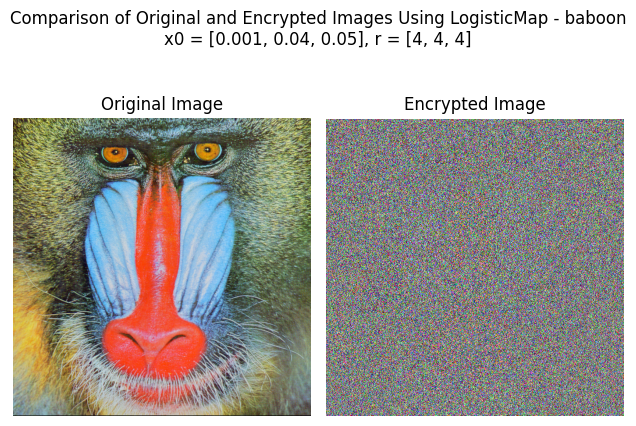

In [ ]:
# Set parameters
x0_log = [0.001,0.04,0.05]  # Initial condition, range : 0-1
r_log = [4,4,4]       # Control parameter, range : 0-4
rgb_matrix = baboon

# Encrypt baboon.png using logistic map
log_baboon = encrypt_logistic(x0_log, r_log, rgb_matrix)
print("")
show_result_comparison(log_baboon)

LogisticMap - camera

Execution time: 7.3238630294799805 seconds
Encrypted image saved as camera_encrypted_log.png



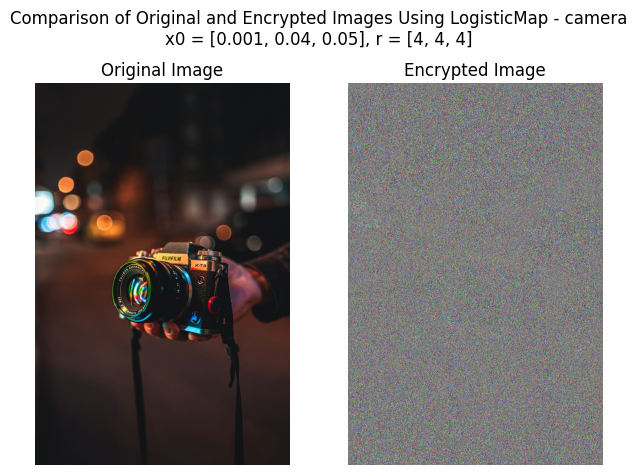

In [ ]:
# Set parameters
x0_log = [0.001,0.04,0.05]  # Initial condition, range : 0-1
r_log = [4,4,4]       # Control parameter, range : 0-4
rgb_matrix = camera

# Encrypt camera.png using logistic map
log_camera = encrypt_logistic(x0_log, r_log, rgb_matrix)
print("")
show_result_comparison(log_camera)

LogisticMap - girl

Execution time: 1.8693177700042725 seconds
Encrypted image saved as girl_encrypted_log.png



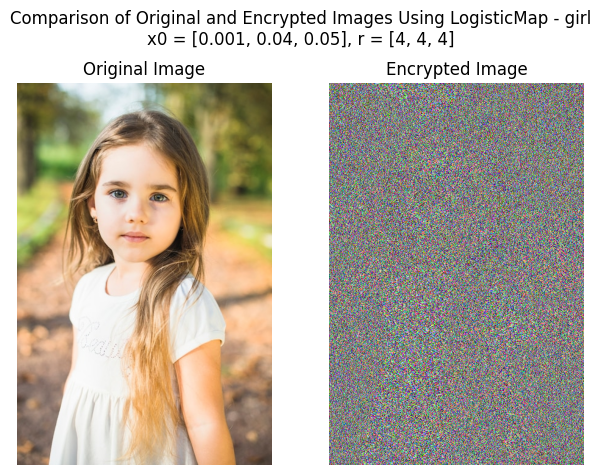

In [ ]:
# Set parameters
x0_log = [0.001,0.04,0.05]  # Initial condition, range : 0-1
r_log = [4,4,4]       # Control parameter, range : 0-4
rgb_matrix = girl

# Encrypt girl.png using logistic map
log_girl = encrypt_logistic(x0_log, r_log, rgb_matrix)
print("")
show_result_comparison(log_girl)

LogisticMap - bird

Execution time: 1.3243262767791748 seconds
Encrypted image saved as bird_encrypted_log.png



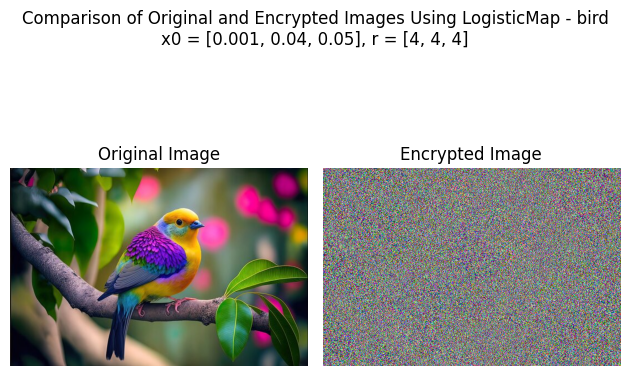

In [ ]:
# Set parameters
x0_log = [0.001,0.04,0.05]  # Initial condition, range : 0-1
r_log = [4,4,4]       # Control parameter, range : 0-4
rgb_matrix = bird

# Encrypt bird.png using logistic map
log_bird = encrypt_logistic(x0_log, r_log, rgb_matrix)
print("")
show_result_comparison(log_bird)

LogisticMap - peppers

Execution time: 12.54429030418396 seconds
Encrypted image saved as peppers_encrypted_log.png



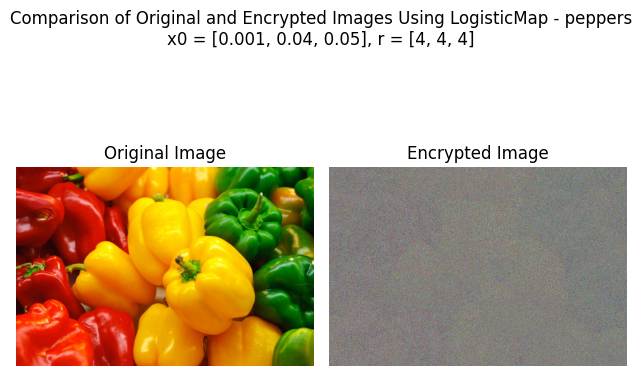

In [ ]:
# Set parameters
x0_log = [0.001,0.04,0.05]  # Initial condition, range : 0-1
r_log = [4,4,4]       # Control parameter, range : 0-4
rgb_matrix = peppers

# Encrypt peppers.png using logistic map
log_peppers = encrypt_logistic(x0_log, r_log, rgb_matrix)
print("")
show_result_comparison(log_peppers)

#  Scenario 2 - Tent Map

## Define Functions

In [ ]:
def TentMap(x, r):
    if 0 <= x < 0.5:
        return r * x
    else:
        return r * (1 - x)

def encrypt_tent(x0_tent, r_tent, rgb_matrix):
    """
    Encrypt an image using tent map.
    """
    file_name, function, rgb_matrix, parameter, key, encrypted_matrix = encrypt_image(x0_tent, r_tent, rgb_matrix, TentMap, 'tent')
    return file_name, function, rgb_matrix, parameter, key, encrypted_matrix

## Encryption Results

### Lena

TentMap - lena

Execution time: 1.2024741172790527 seconds
Encrypted image saved as lena_encrypted_tent.png



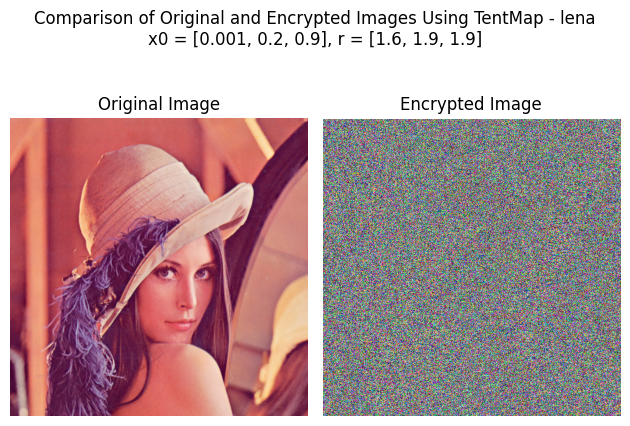

In [ ]:
# Set parameters
x0_tent = [0.001,0.2,0.9]    # Initial condition, range : 0-1
r_tent = [1.6,1.9,1.9]       # Control parameter, range : 0-2
rgb_matrix = lena

# Encrypt lena.png using tent map
tent_lena = encrypt_tent(x0_tent, r_tent, rgb_matrix)
print("")
show_result_comparison(tent_lena)

In [ ]:
show_key(tent_lena)

Total key vectors found : 1

Shape of the key vector: (512, 512)

The key vector generated in tent_lena using x0 = 0.1 and r = 1.9 is:
[[ 48  92 174 ... 159 180 141]
 [216  73 139 ... 207  89 170]
 [160 178 144 ... 162 176 148]
 ...
 [ 37  70 134 ...  66 126 241]
 [ 26  49  94 ...  34  65 124]
 [237  33  63 ... 150 198 107]]


In [ ]:
show_encrypted_matrix(tent_lena)

Total encrypted matrices : 1

Shape of the encrypted matrix: (512, 512, 3)

The encrypted matrix generated in tent_lena
using x0 = 0.1 and r = 1.9 is:

Encrypted matrix - R
[[210 190 113 ... 121 105  69]
 [ 58 171  84 ...  41 132  98]
 [ 66  80  79 ...  68 109  92]
 ...
 [113  18 218 ... 239 210  64]
 [ 72  99  62 ... 145 244 197]
 [191 115  95 ...  37 115 210]]

Encrypted matrix - G
[[185 213  39 ...  11  54 238]
 [ 81 192   2 ...  91 219 201]
 [ 41  59  25 ...  54  50 247]
 ...
 [ 55  84 157 ...  11  58 207]
 [ 12  39 126 ... 100   6  54]
 [251  55  31 ... 208 129  33]]

Encrypted_matrix - B
[[ 77  33  43 ... 229 218 215]
 [165  52  14 ... 181  55 240]
 [221 207  21 ... 216 222 206]
 ...
 [ 25 122 188 ...  22  50 190]
 [ 35   8  96 ... 109  16  45]
 [212  24   1 ... 217 151  58]]



### Others

TentMap - baboon

Execution time: 1.5619943141937256 seconds
Encrypted image saved as baboon_encrypted_tent.png



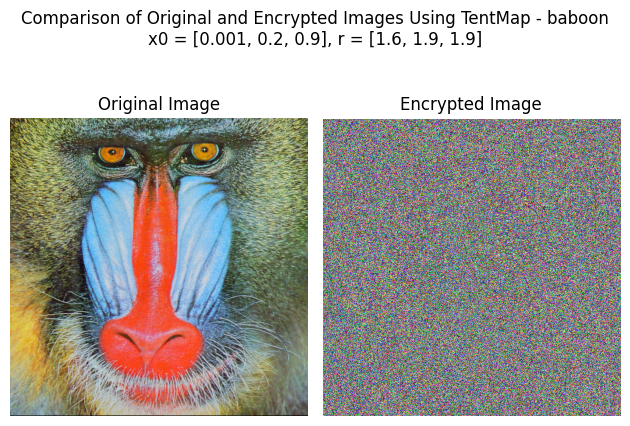

In [ ]:
# Set parameters
x0_tent = [0.001,0.2,0.9]    # Initial condition, range : 0-1
r_tent = [1.6,1.9,1.9]       # Control parameter, range : 0-2
rgb_matrix = baboon

# Encrypt baboon.png using tent map
tent_baboon = encrypt_tent(x0_tent, r_tent, rgb_matrix)
print("")
show_result_comparison(tent_baboon)

TentMap - camera

Execution time: 9.41634202003479 seconds
Encrypted image saved as camera_encrypted_tent.png



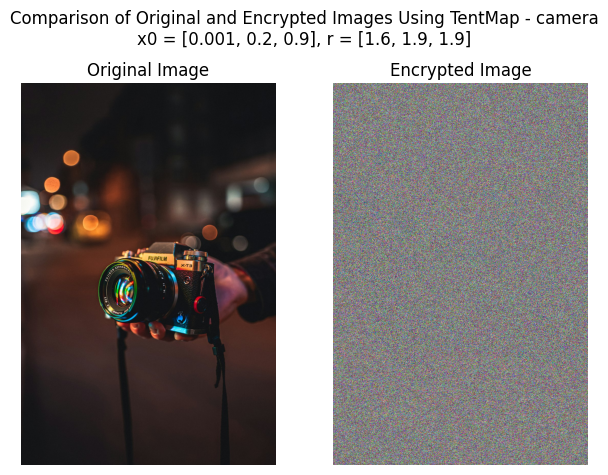

In [ ]:
# Set parameters
x0_tent = [0.001,0.2,0.9]    # Initial condition, range : 0-1
r_tent = [1.6,1.9,1.9]       # Control parameter, range : 0-2
rgb_matrix = camera

# Encrypt camera.png using tent map
tent_camera = encrypt_tent(x0_tent, r_tent, rgb_matrix)
print("")
show_result_comparison(tent_camera)

TentMap - girl

Execution time: 0.8677780628204346 seconds
Encrypted image saved as girl_encrypted_tent.png



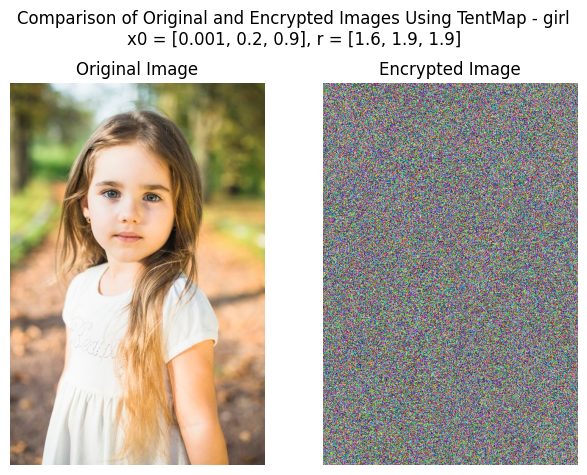

In [ ]:
# Set parameters
x0_tent = [0.001,0.2,0.9]    # Initial condition, range : 0-1
r_tent = [1.6,1.9,1.9]       # Control parameter, range : 0-2
rgb_matrix = girl

# Encrypt girl.png using tent map
tent_girl = encrypt_tent(x0_tent, r_tent, rgb_matrix)
print("")
show_result_comparison(tent_girl)

TentMap - bird

Execution time: 0.6352605819702148 seconds
Encrypted image saved as bird_encrypted_tent.png



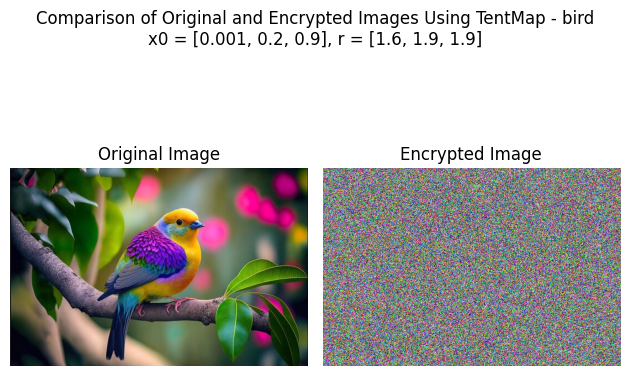

In [ ]:
# Set parameters
x0_tent = [0.001,0.2,0.9]    # Initial condition, range : 0-1
r_tent = [1.6,1.9,1.9]       # Control parameter, range : 0-2
rgb_matrix = bird

# Encrypt bird.png using tent map
tent_bird = encrypt_tent(x0_tent, r_tent, rgb_matrix)
print("")
show_result_comparison(tent_bird)

TentMap - peppers

Execution time: 11.969517469406128 seconds
Encrypted image saved as peppers_encrypted_tent.png



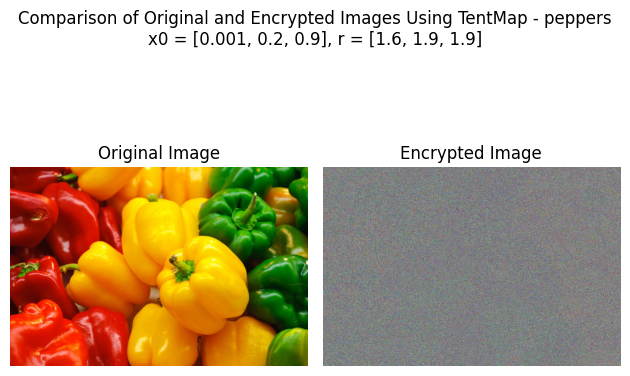

In [ ]:
# Set parameters
x0_tent = [0.001,0.2,0.9]    # Initial condition, range : 0-1
r_tent = [1.6,1.9,1.9]       # Control parameter, range : 0-2
rgb_matrix = peppers

# Encrypt peppers.png using tent map
tent_peppers = encrypt_tent(x0_tent, r_tent, rgb_matrix)
print("")
show_result_comparison(tent_peppers)

# Scenario 3 - Tent Map and Logistic Map Sequentially

## Define Functions

In [ ]:
def encrypt_image_seq(x0_1, r_1, x0_2, r_2, rgb_matrix, function1, function2, code_name):
    """
    Sequentially encrypt an image matrix using two chaos functions.
    """
    # Start timing
    start_time = time.time()

    file_name = find_variable_name(rgb_matrix)
    functions = [function1,function2]
    parameters = {'x0_1': x0_1,'r_1':r_1, 'x0_2' : x0_2,'r_2':r_2}
    encrypted_matrices = []
    key_1 = []
    key_2 = []

    index = 1
    for x01 in parameters['x0_1']:
        for r1 in parameters['r_1']:
          # Generate key
          encryption_key = generate_key(x01,r1,rgb_matrix,function1)
          key_1.append(encryption_key)

          # Encrypt the image
          encrypted_matrix1 = np.zeros_like(rgb_matrix)

          for k in range(3):  # Apply encryption for each color channel
            encrypted_matrix1[:, :, k] = encrypt_matrix(rgb_matrix[:, :, k], encryption_key)

          # Ensure values are within valid range (0-255) and convert to uint8
          encrypted_matrix1 = np.uint8(encrypted_matrix1)

          for x02 in parameters['x0_2']:
            for r2 in parameters['r_2']:
              # Generate key
              encryption_key = generate_key(x02,r2,encrypted_matrix1,function2)
              key_2.append(encryption_key)

              # Encrypt the image
              encrypted_matrix2 = np.zeros_like(encrypted_matrix1)

              for k in range(3):  # Apply encryption for each color channel
                encrypted_matrix2[:, :, k] = encrypt_matrix(encrypted_matrix1[:, :, k], encryption_key)

              # Ensure values are within valid range (0-255) and convert to uint8
              encrypted_matrix2 = np.uint8(encrypted_matrix2)

              # Add the encrypted matrix to the list of encrypted matrices
              encrypted_matrices.append(encrypted_matrix2)

              # Save the encrypted image
              encrypted_image_file_name = f'{file_name}_encrypted_{code_name}_{index}'
              cv2.imwrite(f'{encrypted_image_file_name}.png', encrypted_matrix2)

              index += 1

    # End timing
    end_time = time.time()

    keys = {'key_1' : key_1, 'key_2' : key_2}

    total_encrypted_images = len(x0_1) * len(r_1) * len(x0_2) * len(r_2)
    print(f"Total encrypted images: {total_encrypted_images}")

    # Print the execution time
    execution_time = end_time - start_time
    print(f"Execution time: {execution_time} seconds")

    return file_name, functions, rgb_matrix, parameters, keys, encrypted_matrices

In [ ]:
def show_encryption_result_seq(encryption_data, cols = 4, figsize = (10,8)):
    file_name, function, rgb_matrix, parameter, key, encrypted_matrices = encryption_data

    # Calculate the number of subplots needed
    total_encrypted_images = len(parameter['x0_1']) * len(parameter['r_1']) * len(parameter['x0_2']) * len(parameter['r_2'])
    total_images = total_encrypted_images + 1  # Including the original image
    rows = (total_images + cols - 1) // cols  # Calculate the number of rows needed

    # Prepare to display the results
    fig, axes = plt.subplots(rows, cols,figsize = figsize)

    if rows == 1:
      # Display the original image in the first subplot
      axes[0].imshow(rgb_matrix)
      axes[0].set_title('Original')
      axes[0].axis('off')
    else:
      # Display the original image in the first subplot
      axes[0,0].imshow(rgb_matrix)
      axes[0,0].set_title('Original')
      axes[0,0].axis('off')

    # Flatten the axes array for easy indexing
    axes = axes.flatten()

    # Encrypt the image with each combination of x0 and r and display the results
    index = 1
    for x01 in parameter['x0_1']:
        for r1 in parameter['r_1']:
          for x02 in parameter['x0_2']:
            for r2 in parameter['r_2']:
              # Display the encrypted image
              axes[index].imshow(encrypted_matrices[index - 1])
              axes[index].set_title(f'x0_1={x01}, r_1={r1}, x0_2={x02}, r_2={r2}')
              axes[index].axis('off')
              index += 1

    # Hide any remaining empty subplots
    for i in range(index, len(axes)):
        axes[i].axis('off')

    x0_join = [parameter['x0_1'],parameter['x0_2']]
    r_join = [parameter['r_1'],parameter['r_2']]

    plt.suptitle(f'Comparison of Original and Encrypted Images Using TentMap & LogisticMap Sequentially - {file_name}\nx0 = {x0_join}, r = {r_join}')
    plt.subplots_adjust(wspace=0.1)

    plt.tight_layout()
    plt.show()

# def show_key_seq(encryption_data):
#     file_name, function, rgb_matrix, parameter, key, encrypted_matrices = encryption_data

#     variable_name = find_variable_name(encryption_data)

#     print(f'Total key vectors found : {len(key)}\n')
#     if len(key) == 1:
#        x0_1_index = parameter['x0_1'].index(x0_1)
#        r_1 = float(input("r_1 = "))
#        r_1_index = parameter['r_1'].index(r_1)
#        x0_2 = float(input("x0_2 = "))
#        x0_2_index = parameter['x0_2'].index(x0_2)
#        r_2 = float(input("r_2 = "))
#        r_2_index = parameter['r_2'].index(r_2)

#        print(f"Shape of the first key matrix: {key1.shape}\n")
#        print(f"\033[1mThe key generated in {variable_name} using x0_1 = {x0_1} and r_1 = {r_1} is:\033[0m\n{key['key_1'][0]}")

#        print(f"Shape of the second key matrix: {key2.shape}\n")
#        print(f"\033[1mThe key generated in {variable_name} using x0_2 = {x0_2} and r_2 = {r_2} is:\033[0m\n{key['key_2'][0]}")
#     else:
#       print("Enter the parameters used for the key vector you want to display")
#       x0_1 = float(input("x0_1 = "))
#       x0_1_index = parameter['x0_1'].index(x0_1)
#       r_1 = float(input("r_1 = "))
#       r_1_index = parameter['r_1'].index(r_1)
#       x0_2 = float(input("x0_2 = "))
#       x0_2_index = parameter['x0_2'].index(x0_2)
#       r_2 = float(input("r_2 = "))
#       r_2_index = parameter['r_2'].index(r_2)
#       print("")

#       # Find the index of the key generated using x0_index and r_index
#       try:
#           # Calculate the key index using x0_index and r_index
#           key_1_index = x0_1_index * len(parameter["r_1"]) + r_1_index

#           # Get the key using the calculated key index
#           key1 = key['key_1'][key_1_index]

#           # Calculate the key index using x0_index and r_index
#           key_2_index = x0_2_index * len(parameter["r_2"]) + r_2_index

#           # Get the key using the calculated key index
#           key2 = key['key_2'][key_2_index]

#           print(f"Shape of the first key matrix: {key1.shape}\n")
#           print(f"\033[1mThe key generated in {variable_name} using x0_1 = {x0_1} and r_1 = {r_1} is:\033[0m\n{key1}")

#           print(f"Shape of the second key matrix: {key2.shape}\n")
#           print(f"\033[1mThe key generated in {variable_name} using x0_2 = {x0_2} and r_2 = {r_2} is:\033[0m\n{key2}")

#       except ValueError:
#           print("Invalid input for x0_1, x0_2, r_1 or r_2.")
#       except IndexError:
#           print("Index out of range. Make sure x0 and r values are within the specified ranges.")

# def show_encrypted_matrix(encryption_data):
#     file_name, function, rgb_matrix, parameter, key, encrypted_matrices = encryption_data

#     variable_name = find_variable_name(encryption_data)

#     print(f'Total encrypted matrices : {len(encrypted_matrices)}\n')
#     if len(encrypted_matrices) == 1:
#        x0 = parameter["x0"][0]
#        r = parameter["r"][0]

#        print(f"Shape of the encrypted matrix: {encrypted_matrices[0].shape}\n")
#        print(f"\033[1mThe encrypted matrix generated in {variable_name}\nusing x0 = {x0} and r = {r} is:\033[0m\n")

#        for k in range(3):
#           if k == 0:
#             print('Encrypted matrix - R')
#           elif k == 1:
#             print('Encrypted matrix - G')
#           else:
#             print('Encrypted_matrix - B')

#           print(encrypted_matrices[0][:,:,k])
#           print('')
#     else:
#       print("Enter the parameters used for the encrypted matrix you want to display")
#       x0 = float(input("x0 = "))
#       x0_index = parameter['x0'].index(x0)
#       r = float(input("r = "))
#       r_index = parameter['r'].index(r)
#       print("")

#       # Find the index of the encrypted_matrices generated using x0_index and r_index
#       try:
#           # Calculate the encrypted_matrices index using x0_index and r_index
#           encrypted_matrices_index = x0_index * len(parameter["r"]) + r_index

#           # Get the encrypted_matrices using the calculated encrypted_matrices index
#           encrypted_matrix = encrypted_matrices[encrypted_matrices_index]

#           print(f"Shape of the encrypted matrix: {encrypted_matrix.shape}\n")
#           print(f"\033[1mThe encrypted matrix generated in {variable_name}\nusing x0 = {x0} and r = {r} is:\033[0m\n")

#           for k in range(3):
#             if k == 0:
#               print('Encrypted matrix - R')
#             elif k == 1:
#               print('Encrypted matrix - G')
#             else:
#               print('Encrypted_matrix - B')

#             print(encrypted_matrix[:,:,k])
#             print('')

Total encrypted images: 1
Execution time: 2.4897773265838623 seconds


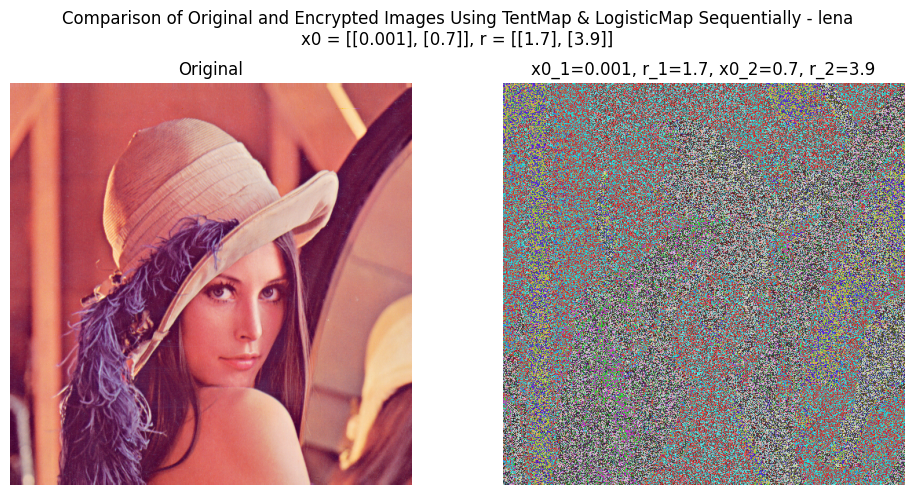

In [ ]:
# Set parameters for tent_map
x0_tent = [0.001]    # Initial condition, range : 0-1
r_tent = [1.7]       # Control parameter, range : 0-2

# Set parameters for logistic_map
x0_log = [0.7]    # Initial condition, range : 0-1
r_log = [3.9]       # Control parameter, range : 0-4

# Define the rgb_matrix
rgb_matrix = lena

# Encrypt lena.png using tent map and logistic map sequentially
tent_log_lena = encrypt_image_seq(x0_tent, r_tent, x0_log, r_log, rgb_matrix, TentMap, LogisticMap, 'tent_log_seq')
show_encryption_result_seq(tent_log_lena, cols = 2, figsize = (10,5))

In [ ]:
print("Key 1 - TentMap")
print(tent_log_lena[4]['key_1'][0])
print("")
print("Key 2 - LogisticMap")
print(tent_log_lena[4]['key_2'][0])

Key 1 - TentMap
[[  0   0   1 ... 103 176 134]
 [205  83 142 ... 153 172 139]
 [196 100 170 ... 150 177 130]
 ...
 [204  85 145 ... 169 144 187]
 [115 196 100 ... 153 172 140]
 [194 103 175 ... 126 214  68]]

Key 2 - LogisticMap
[[208 147 242 ... 187 193 182]
 [202 162 229 ...  26  93 231]
 [ 84 220 117 ... 123 248  24]
 ...
 [247  28  99 ... 245  37 123]
 [248  24  87 ... 225 101 238]
 [ 59 178 209 ... 191 186 194]]


In [ ]:
print('Encrypted matrix - R')
print(tent_log_lena[5][0][0])
print("")
print('Encrypted matrix - G')
print(tent_log_lena[5][0][1])
print("")
print('Encrypted_matrix - B')
print(tent_log_lena[5][0][2])

Encrypted matrix - R
[[ 50  89 173]
 [113  26 238]
 [ 44 122 118]
 ...
 [ 58  72 166]
 [172 243  31]
 [248  83 106]]

Encrypted matrix - G
[[229 142 122]
 [ 19 120 140]
 [180 226 238]
 ...
 [101  23 249]
 [ 44 115 159]
 [164  15  54]]

Encrypted_matrix - B
[[114  25 237]
 [ 90  49 197]
 [  0  86  90]
 ...
 [ 11 121 151]
 [148 203  39]
 [ 82 249 192]]


Total encrypted images: 1
Execution time: 4.1244213581085205 seconds


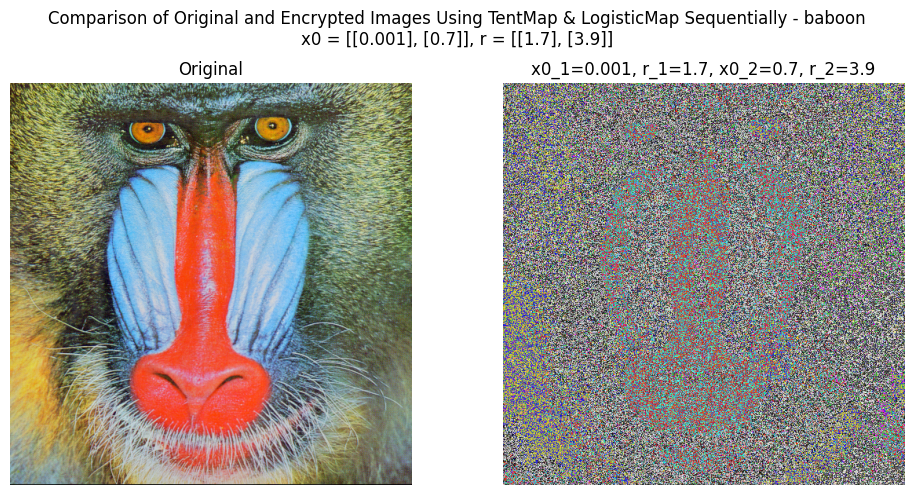

In [ ]:
# Set parameters for tent_map
x0_tent = [0.001]    # Initial condition, range : 0-1
r_tent = [1.7]       # Control parameter, range : 0-2

# Set parameters for logistic_map
x0_log = [0.7]    # Initial condition, range : 0-1
r_log = [3.9]       # Control parameter, range : 0-4

# Define the rgb_matrix
rgb_matrix = baboon

# Encrypt baboon.png using tent map and logistic map sequentially
tent_log_baboon = encrypt_image_seq(x0_tent, r_tent, x0_log, r_log, rgb_matrix, TentMap, LogisticMap, 'tent_log_seq')
show_encryption_result_seq(tent_log_baboon, cols = 2, figsize = (10,5))

Total encrypted images: 1
Execution time: 2.5753564834594727 seconds


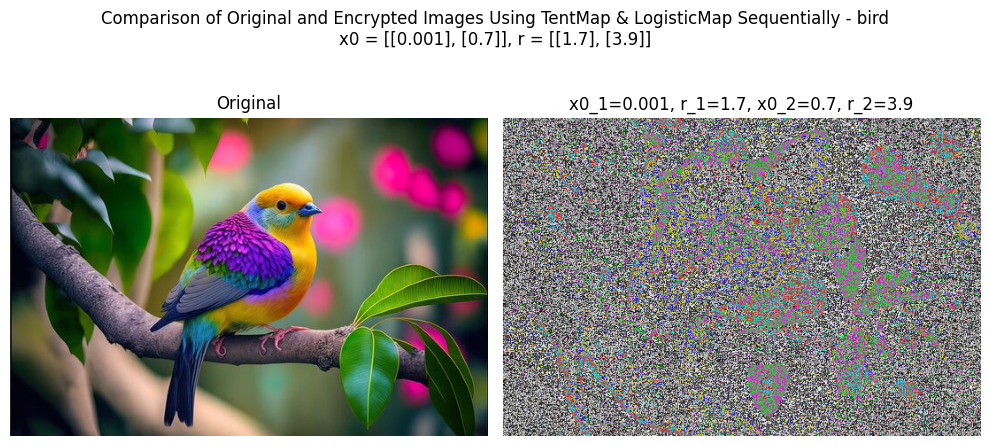

In [ ]:
# Set parameters for tent_map
x0_tent = [0.001]    # Initial condition, range : 0-1
r_tent = [1.7]       # Control parameter, range : 0-2

# Set parameters for logistic_map
x0_log = [0.7]    # Initial condition, range : 0-1
r_log = [3.9]       # Control parameter, range : 0-4

# Define the rgb_matrix
rgb_matrix = bird

# Encrypt bird.png using tent map and logistic map sequentially
tent_log_bird = encrypt_image_seq(x0_tent, r_tent, x0_log, r_log, rgb_matrix, TentMap, LogisticMap, 'tent_log_seq')
show_encryption_result_seq(tent_log_bird, cols = 2, figsize = (10,5))

Total encrypted images: 1
Execution time: 9.52675175666809 seconds


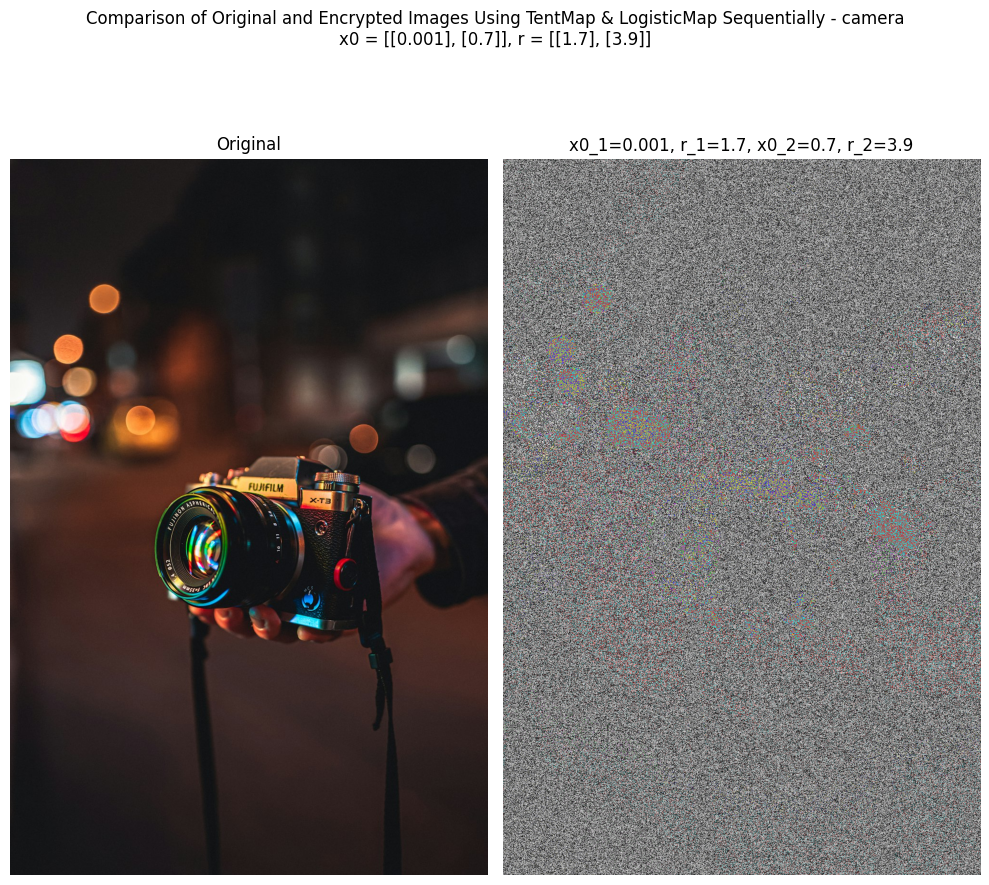

In [ ]:
# Set parameters for tent_map
x0_tent = [0.001]    # Initial condition, range : 0-1
r_tent = [1.7]       # Control parameter, range : 0-2

# Set parameters for logistic_map
x0_log = [0.7]    # Initial condition, range : 0-1
r_log = [3.9]       # Control parameter, range : 0-4

# Define the rgb_matrix
rgb_matrix = camera

# Encrypt camera.png using tent map and logistic map sequentially
tent_log_camera = encrypt_image_seq(x0_tent, r_tent, x0_log, r_log, rgb_matrix, TentMap, LogisticMap, 'tent_log_seq')
show_encryption_result_seq(tent_log_camera, cols = 2, figsize = (10,10))

Total encrypted images: 1
Execution time: 1.2575109004974365 seconds


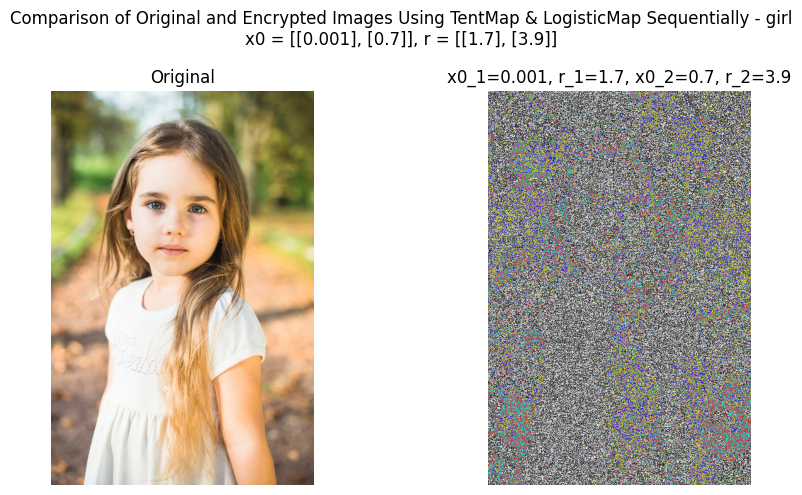

In [ ]:
# Set parameters for tent_map
x0_tent = [0.001]    # Initial condition, range : 0-1
r_tent = [1.7]       # Control parameter, range : 0-2

# Set parameters for logistic_map
x0_log = [0.7]    # Initial condition, range : 0-1
r_log = [3.9]       # Control parameter, range : 0-4

# Define the rgb_matrix
rgb_matrix = girl

# Encrypt girl.png using tent map and logistic map sequentially
tent_log_girl = encrypt_image_seq(x0_tent, r_tent, x0_log, r_log, rgb_matrix, TentMap, LogisticMap, 'tent_log_seq')
show_encryption_result_seq(tent_log_girl, cols = 2, figsize = (10,5))

Total encrypted images: 1
Execution time: 18.07280731201172 seconds


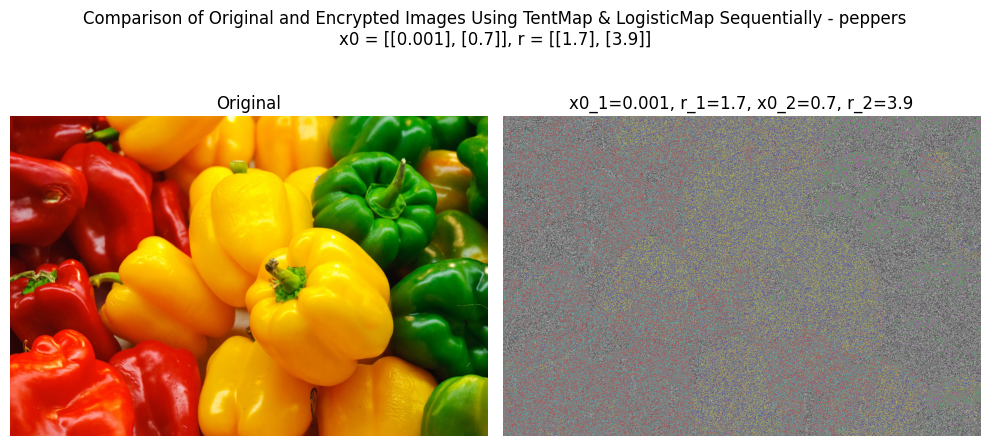

In [ ]:
# Set parameters for tent_map
x0_tent = [0.001]    # Initial condition, range : 0-1
r_tent = [1.7]       # Control parameter, range : 0-2

# Set parameters for logistic_map
x0_log = [0.7]    # Initial condition, range : 0-1
r_log = [3.9]       # Control parameter, range : 0-4

# Define the rgb_matrix
rgb_matrix = peppers

# Encrypt peppers.png using tent map and logistic map sequentially
tent_log_peppers = encrypt_image_seq(x0_tent, r_tent, x0_log, r_log, rgb_matrix, TentMap, LogisticMap, 'tent_log_seq')
show_encryption_result_seq(tent_log_peppers, cols = 2, figsize = (10,5))

# Scenario 4 - Composition Function of Logistic Map and Tent Map

## Define Functions

In [ ]:
def CompLogTentMap(x, r):
    if 0 <= x < 0.5:
        return r * (r*x) * (1 - r*x)
    else:
        return r * (r*(1 - x)) * (1 - r*(1-x))

def CompLogTentMap_derivative(x, r):
    if 0 <= x < 0.5:
        return r**2 - 2*(r**3)*x
    else:
        return 2*(r**3) - (r**2) -2*(r**3)*x

def encrypt_comp_logtent(x0_logtent, r_logtent, rgb_matrix):
    """
    Encrypt an image using tent map.
    """
    file_name, function, rgb_matrix, parameter, key, encrypted_matrix = encrypt_image(x0_logtent, r_logtent, rgb_matrix, CompLogTentMap, 'comp_logtent')
    return file_name, function, rgb_matrix, parameter, key, encrypted_matrix

## Bifurcation Diagram

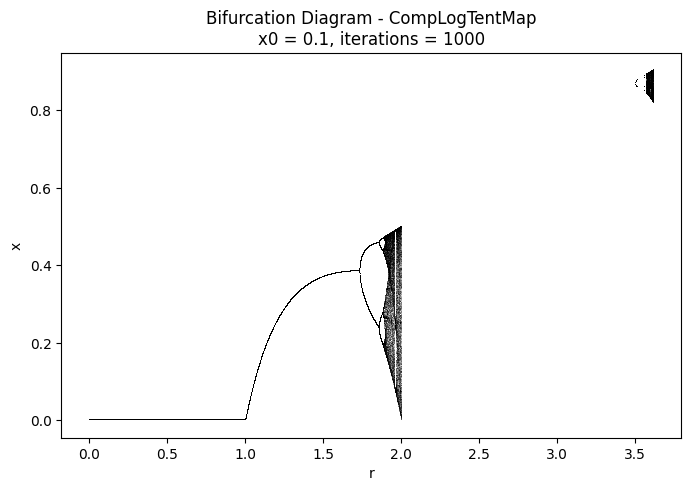

In [ ]:
# Bifurcation diagram parameters
x0 = 0.1
r_min = 0
r_max = 4
num_r = 10000
iterations = 1000

# Show the bifurcation diagram
show_bifurcation_diagram(CompLogTentMap,x0,r_min,r_max,num_r,iterations)

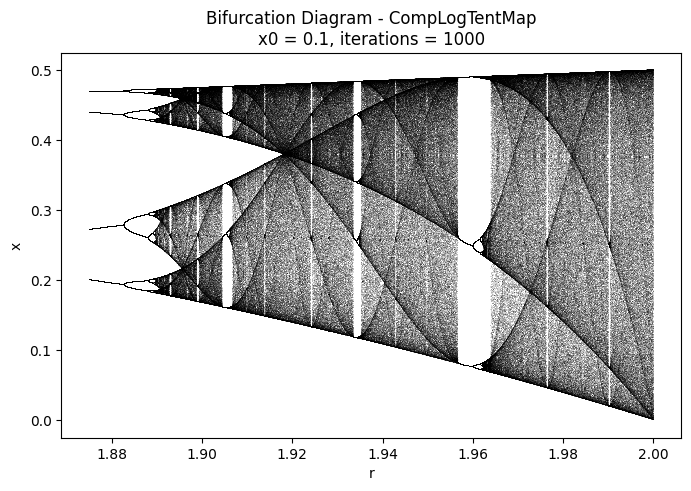

In [ ]:
# Bifurcation diagram parameters
x0 = 0.1
r_min = 1.875
r_max = 2
num_r = 10000
iterations = 1000

# Show the bifurcation diagram
show_bifurcation_diagram(CompLogTentMap,x0,r_min,r_max,num_r,iterations)

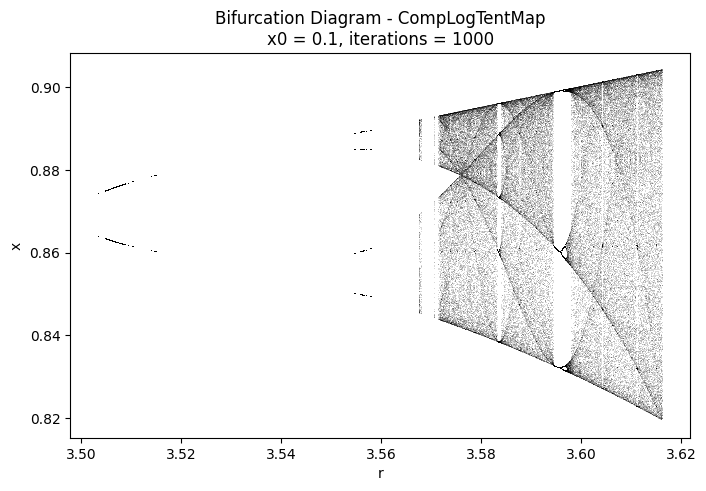

In [ ]:
# Bifurcation diagram parameters
x0 = 0.1
r_min = 3.5
r_max = 4
num_r = 10000
iterations = 1000

# Show the bifurcation diagram
show_bifurcation_diagram(CompLogTentMap,x0,r_min,r_max,num_r,iterations)

## Lyapunov Exponent

In [ ]:
# Parameters for Lyapunov exponent
x0 = 0.001
r_min = 0
r_max = 4.0
num_r = 10000
iterations = 1000

# Plot the Lyapunov exponent diagram for logistic map
show_lyapunov_diagram(CompLogTentMap, CompLogTentMap_derivative, x0, r_min, r_max, num_r, iterations)

In [ ]:
# Parameters for Lyapunov exponent
x0 = 0.001
r_min = 1.88
r_max = 2.2
num_r = 10000
iterations = 1000

# Plot the Lyapunov exponent diagram for logistic map
show_lyapunov_diagram(CompLogTentMap, CompLogTentMap_derivative, x0, r_min, r_max, num_r, iterations)

In [ ]:
# Parameters for Lyapunov exponent
x0 = 0.001
r_min = 3.568
r_max = 4
num_r = 10000
iterations = 1000

# Plot the Lyapunov exponent diagram for logistic map
show_lyapunov_diagram(CompLogTentMap, CompLogTentMap_derivative, x0, r_min, r_max, num_r, iterations)

## Encryption Results

### Lena

CompLogTentMap - lena

Execution time: 2.1588854789733887 seconds
Encrypted image saved as lena_encrypted_comp_logtent.png



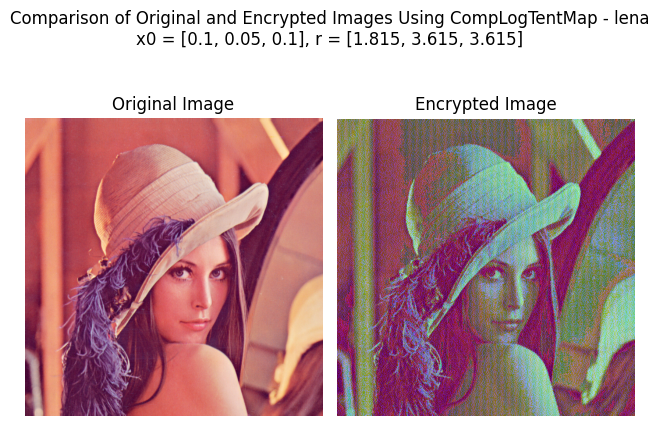

In [ ]:
# Set parameters
x0_logtent = [0.1,0.05,0.1]          # Initial condition, range : 0-1
r_logtent  = [1.815,3.615,3.615]       # Control parameter, range : 0-4
rgb_matrix = lena

# Encrypt lena.png using the composition function of logistic map and tent map
logtent_lena = encrypt_comp_logtent(x0_logtent, r_logtent, rgb_matrix)
print("")
show_result_comparison(logtent_lena)

In [ ]:
show_key(logtent_lena)

Total key vectors found : 1

Shape of the key vector: (512, 512)

The key vector generated in logtent_lena using x0 = 0.1 and r = 3.615 is:
[[212 221 229 ... 230 209 210]
 [213 222 228 ... 228 215 227]
 [220 230 209 ... 229 211 217]
 ...
 [209 211 219 ... 228 214 225]
 [224 226 221 ... 223 227 219]
 [230 209 209 ... 217 229 212]]


In [ ]:
show_encrypted_matrix(logtent_lena)

Total encrypted matrices : 1

Shape of the encrypted matrix: (512, 512, 3)

The encrypted matrix generated in logtent_lena
using x0 = 0.1 and r = 3.615 is:

Encrypted matrix - R
[[ 54  63  58 ...   0  12  26]
 [ 55  60  59 ...   2  10  43]
 [ 62   4  14 ...   3  14  17]
 ...
 [133 135 135 ...  73 122  80]
 [178 176 189 ... 108  86  98]
 [180 131 177 ... 106  80 109]]

Encrypted matrix - G
[[ 93  84 108 ... 114  83 177]
 [ 92  87 109 ... 112  85 128]
 [ 85 111  88 ... 113  81 186]
 ...
 [195 193 192 ... 173 146 223]
 [246 244 253 ... 153 164 145]
 [240 199 241 ... 159 162 158]]

Encrypted_matrix - B
[[169 160  96 ... 156 191 136]
 [168 163  97 ... 158 185 185]
 [161 155  84 ... 159 189 131]
 ...
 [237 239 225 ... 176 154 174]
 [217 219 227 ... 144 178 138]
 [223 232 239 ... 150 180 133]]



### Others